In [1]:
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
% matplotlib inline
from gensim import corpora, models
from gensim.models import Phrases, Word2Vec
from gensim.models.phrases import Phraser
from nltk.corpus import stopwords
from nltk import word_tokenize, sent_tokenize
import re
import string
import pyLDAvis.gensim
from collections import defaultdict

In [2]:
path = "data/abstract_text_fy/"

# Uncomment next 2 cells to import all files

In [3]:
abstracts_names = ["text_list_1985",
                   "text_list_1986",
                   "text_list_1987",
                   "text_list_1988",
                   "text_list_1989",
                   "text_list_1990",
                   "text_list_1991",
                   "text_list_1992",
                   "text_list_1993",
                   "text_list_1994",
                   "text_list_1995",
                   "text_list_1996",
                   "text_list_1997",
                   "text_list_1998",
                   "text_list_1999",
                   "text_list_2000",
                   "text_list_2001",
                   "text_list_2002",
                   "text_list_2003",
                   "text_list_2004",
                   "text_list_2005",
                   "text_list_2006",
                   "text_list_2007",
                   "text_list_2008",
                   "text_list_2009",
                   "text_list_2010",
                   "text_list_2011",
                   "text_list_2012",
                   "text_list_2013",
                   "text_list_2014",
                   "text_list_2015",
                   "text_list_2016",
                   "text_list_2017",
                   "text_list_2018"]

In [4]:
abstracts_lists = list()
for a in abstracts_names:
    abstracts_lists.append(pickle.load(open(path+a+".p", "rb")))
    
[text_list_1985,
 text_list_1986,
 text_list_1987,
 text_list_1988,
 text_list_1989,
 text_list_1990,
 text_list_1991,
 text_list_1992,
 text_list_1993,
 text_list_1994,
 text_list_1995,
 text_list_1996,
 text_list_1997,
 text_list_1998,
 text_list_1999,
 text_list_2000,
 text_list_2001,
 text_list_2002,
 text_list_2003,
 text_list_2004,
 text_list_2005,
 text_list_2006,
 text_list_2007,
 text_list_2008,
 text_list_2009,
 text_list_2010,
 text_list_2011,
 text_list_2012,
 text_list_2013,
 text_list_2014,
 text_list_2015,
 text_list_2016,
 text_list_2017,
 text_list_2018] = abstracts_lists

# For right now just work with 2001 (it has the fewest abstracts)

In [4]:
text_list_2001 = pickle.load(open(path+"text_list_2001"+".p", "rb"))

In [23]:
text_list_2001_2 = [re.sub(" +", " ", abstract) for abstract in text_list_2001]

In [12]:
text_list_2001_2

[' Students heavy drinking has been described as "by far the single most serious public health problem confronting American colleges". This research aims to facilitate development of improved alcohol abuse prevention programs for fraternity men. Specifically, this research seeks to evaluate the impact of two national fraternities\' alcohol abuse prevention programs, and to examine associations between changes in theoretical alcohol consumption determinants and reductions in alcohol consumption levels among fraternity men. The first year of this research will utilized a matched pair, randomized pre-post design to measure the impact of prevention activities in 10 fraternity chapters, compared to 10 delayed intervention control chapters. Sixty chapters will participate in years two and three of the investigation. Impact will be assessed in terms of reduction in alcohol use as well as changes in hypothesized alcohol behavior determinants such as: perceived collective efficacy of the chapte

In [24]:
things_to_remove = ["(Adapted from applicant's abstract)",
                    "(provided by applicant)",
                    "(Verbatim from applicants abstract)",
                    "Purpose",
                    "(Adapted from the Applicant's )",
                    " N A",
                    "(provided by investigator)",
                    "(From the Applicant's )"]
punct = [p for p in string.punctuation]+["``", "''"]

In [25]:
for t in things_to_remove:
    text_list_2001_2 = [abstract.replace(t, "") for abstract in text_list_2001_2]

In [26]:
stop_words = stopwords.words("english")
sent_word_tokens = []
for s in text_list_2001_2:
    sent = sent_tokenize(s)
    sents = []
    for w in sent:
        words = word_tokenize(w)
        words = [word.lower() for word in words if word not in punct]
        words = [word for word in words if word not in stop_words]
        words = [word for word in words if not word.isdigit()]
        sents.append(words)
    sent_word_tokens.append(sents)
    

KeyboardInterrupt: 

In [9]:
sent_word_tokens[0]

[['students',
  'heavy',
  'drinking',
  'described',
  'far',
  'single',
  'serious',
  'public',
  'health',
  'problem',
  'confronting',
  'american',
  'colleges'],
 ['research',
  'aims',
  'facilitate',
  'development',
  'improved',
  'alcohol',
  'abuse',
  'prevention',
  'programs',
  'fraternity',
  'men'],
 ['specifically',
  'research',
  'seeks',
  'evaluate',
  'impact',
  'two',
  'national',
  'fraternities',
  'alcohol',
  'abuse',
  'prevention',
  'programs',
  'examine',
  'associations',
  'changes',
  'theoretical',
  'alcohol',
  'consumption',
  'determinants',
  'reductions',
  'alcohol',
  'consumption',
  'levels',
  'among',
  'fraternity',
  'men'],
 ['first',
  'year',
  'research',
  'utilized',
  'matched',
  'pair',
  'randomized',
  'pre-post',
  'design',
  'measure',
  'impact',
  'prevention',
  'activities',
  'fraternity',
  'chapters',
  'compared',
  'delayed',
  'intervention',
  'control',
  'chapters'],
 ['sixty',
  'chapters',
  'particip

In [33]:
phrases = Phrases(sent_word_tokens[0], min_count = 1, threshold = 2)

In [34]:
#Phraser is inside models.phrases, for import purposes
bigram = Phraser(phrases)

In [35]:
#bigram = Phrases(sent_word_tokens[0], min_count=1, threshold=2)
sent = sent_word_tokens[0][2]
print(bigram[sent])

['specifically', 'research', 'seeks', 'evaluate', 'impact', 'two', 'national', 'fraternities', 'alcohol_abuse', 'prevention_programs', 'examine', 'associations', 'changes', 'theoretical', 'alcohol_consumption', 'determinants', 'reductions', 'alcohol_consumption', 'levels', 'among', 'fraternity_men']


In [36]:
print(list(bigram[sent_word_tokens[0]]))

[['students', 'heavy', 'drinking', 'described', 'far', 'single', 'serious', 'public', 'health', 'problem', 'confronting', 'american', 'colleges'], ['this', 'research', 'aims', 'facilitate', 'development', 'improved', 'alcohol_abuse', 'prevention_programs', 'fraternity_men'], ['specifically', 'research', 'seeks', 'evaluate', 'impact', 'two', 'national', 'fraternities', 'alcohol_abuse', 'prevention_programs', 'examine', 'associations', 'changes', 'theoretical', 'alcohol_consumption', 'determinants', 'reductions', 'alcohol_consumption', 'levels', 'among', 'fraternity_men'], ['the', 'first', 'year', 'research', 'utilized', 'matched', 'pair', 'randomized', 'pre-post', 'design', 'measure', 'impact', 'prevention', 'activities', '10', 'fraternity', 'chapters', 'compared', '10', 'delayed', 'intervention', 'control', 'chapters'], ['sixty', 'chapters', 'participate', 'years', 'two', 'three', 'investigation'], ['impact', 'assessed', 'terms', 'reduction', 'alcohol_use', 'well', 'changes', 'hypothes

In [38]:
phrases.add_vocab(sent_word_tokens[1])

In [50]:
print(bigram[sent_word_tokens[1][3]])

['i', 'test', 'hypothesis', 'mutations', 'contact', 'regions', 'proteins', 'pathway', 'result', 'better', 'coupling', 'wild-type']


In [3]:
# Figure out how to make trigrams/n-grams
# This code doens't work
#bigram_2 = Phraser(sent_word_tokens[0])
#trigram = Phraser(bigram_2([sent_word_tokens[0]]))

### bring back in LSI and use pyLDAvis to visualize it then use phrases and put that into lsi
<br>
### Then try with word2vec/fasttext instead of tfidf, see how that works as target for lsi

In [27]:
def clean_abstract_text(a):
    """Clean list of documents to remove stopwords, punctuation, and digits. Return list of tokens."""
    stop_words = stopwords.words("english")
    punct = list(string.punctuation)+['``', "''"]
    tokens = word_tokenize(a.lower())
    tokens_no_stop = [token for token in tokens if token not in stop_words]
    tokens_no_punct = [token for token in tokens_no_stop if token not in punct]
    tokens_no_digit = [token for token in tokens_no_punct if not token.isdigit()]
    #tokens_stemmed = [ps.stem(token) for token in tokens_no_digit]
    return(tokens_no_digit)

In [38]:
abstract_clean_list = list()
for a in text_list_2001:
    tokens_stemmed = clean_abstract_text(a)
    abstract_clean_list.append(tokens_stemmed)

In [40]:
frequency = defaultdict(int)

defaultdict(int, {})

In [41]:
for a in abstract_clean_list:
    for token in a:
        frequency[token] += 1
frequency

defaultdict(int,
            {'students': 1227,
             'heavy': 173,
             'drinking': 179,
             'described': 633,
             'far': 226,
             'single': 1240,
             'serious': 176,
             'public': 822,
             'health': 4797,
             'problem': 662,
             'confronting': 8,
             'american': 540,
             'colleges': 61,
             'research': 21736,
             'aims': 3081,
             'facilitate': 1130,
             'development': 9572,
             'improved': 744,
             'alcohol': 980,
             'abuse': 1128,
             'prevention': 2462,
             'programs': 2620,
             'fraternity': 4,
             'men': 587,
             'specifically': 1451,
             'seeks': 464,
             'evaluate': 1639,
             'impact': 1086,
             'two': 5629,
             'national': 1125,
             'fraternities': 1,
             'examine': 2675,
             'associations': 228

In [43]:
abstracts = [[token for token in text if frequency[token] > 3] for text in abstract_clean_list]
abstracts

[['students',
  'heavy',
  'drinking',
  'described',
  'far',
  'single',
  'serious',
  'public',
  'health',
  'problem',
  'confronting',
  'american',
  'colleges',
  'research',
  'aims',
  'facilitate',
  'development',
  'improved',
  'alcohol',
  'abuse',
  'prevention',
  'programs',
  'fraternity',
  'men',
  'specifically',
  'research',
  'seeks',
  'evaluate',
  'impact',
  'two',
  'national',
  'alcohol',
  'abuse',
  'prevention',
  'programs',
  'examine',
  'associations',
  'changes',
  'theoretical',
  'alcohol',
  'consumption',
  'determinants',
  'reductions',
  'alcohol',
  'consumption',
  'levels',
  'among',
  'fraternity',
  'men',
  'first',
  'year',
  'research',
  'utilized',
  'matched',
  'pair',
  'randomized',
  'design',
  'measure',
  'impact',
  'prevention',
  'activities',
  'fraternity',
  'chapters',
  'compared',
  'delayed',
  'intervention',
  'control',
  'chapters',
  'sixty',
  'chapters',
  'participate',
  'years',
  'two',
  'three',

In [44]:
dictionary = corpora.Dictionary(abstracts)
#dictionary.save('/tmp/deerwester.dict')  # store the dictionary, for future reference
print(dictionary)

Dictionary(27831 unique tokens: ['abuse', 'account', 'activities', 'aims', 'alcohol']...)


In [45]:
corpus = [dictionary.doc2bow(a) for a in abstracts]
#corpora.MmCorpus.serialize('/tmp/deerwester.mm', corpus)  # store to disk, for later use


In [48]:
tfidf = models.TfidfModel(corpus)

In [49]:
corpus_tfidf = tfidf[corpus]

In [27]:
lsi = models.LsiModel(corpus_tfidf, id2word=dictionary, num_topics=500)

In [28]:
lsi.print_topics(19)

[(0,
  '0.227*"cancer" + 0.197*"research" + 0.168*"center" + 0.156*"clinical" + 0.123*"gcrc" + 0.117*"core" + 0.115*"program" + 0.109*"facility" + 0.104*"patients" + 0.096*"training"'),
 (1,
  '0.185*"facility" + 0.175*"stanford" + 0.153*"d." + 0.152*"b." + 0.130*"monitoring" + 0.122*"gcrc" + 0.115*"heart" + 0.110*"hospital" + 0.107*"diabetes" + 0.105*"patients"'),
 (2,
  '-0.222*"center" + -0.143*"research" + -0.141*"cancer" + -0.141*"yale" + -0.140*"resources" + -0.126*"unit" + 0.126*"cells" + -0.121*"gcrc" + -0.120*"facilities" + -0.116*"training"'),
 (3,
  '-0.471*"cancer" + 0.202*"gcrc" + 0.198*"yale" + -0.177*"center" + 0.170*"unit" + -0.136*"programs" + 0.119*"medicine" + 0.104*"facilities" + -0.095*"nci" + 0.093*"nursing"'),
 (4,
  '0.252*"yale" + 0.200*"cancer" + -0.161*"m.d" + 0.150*"facilities" + -0.144*"training" + 0.138*"unit" + 0.130*"resources" + -0.112*"program" + -0.107*"wisconsin" + -0.105*"satellite"'),
 (5,
  '0.208*"cancer" + 0.206*"diseases" + -0.180*"training" + 

In [29]:
corpus_lsi = lsi[corpus_tfidf]

In [30]:
pyLDAvis.enable_notebook()

In [36]:
# May only work with lda?
pyLDAvis.gensim.prepare(lsi, corpus, dictionary)

AttributeError: 'LsiModel' object has no attribute 'inference'

In [38]:
lda = models.LdaModel(corpus = corpus_tfidf, num_topics = 500, id2word = dictionary)

/Users/maheshrao/anaconda3/envs/capstone/lib/python3.6/site-packages/gensim/models/ldamodel.py:775: RuntimeWarning: divide by zero encountered in log
  diff = np.log(self.expElogbeta)


In [39]:
pyLDAvis.gensim.prepare(lda, corpus, dictionary)

/Users/maheshrao/anaconda3/envs/capstone/lib/python3.6/site-packages/pyLDAvis/_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
165   -0.385701  0.123497       1        1  25.164604
413   -0.392965  0.209256       2        1  15.286427
111   -0.380998  0.015327       3        1   7.676718
314   -0.366886  0.109443       4        1   4.927682
126   -0.347845  0.133692       5        1   3.099897
354   -0.356084  0.053315       6        1   2.938477
42    -0.318157  0.103234       7        1   1.665467
49    -0.343989  0.003793       8        1   1.606941
402   -0.292547  0.104728       9        1   1.080664
137   -0.224439  0.098021      10        1   1.006991
239   -0.307270 -0.098478      11        1   1.005741
240   -0.258859 -0.084878      12        1   0.875391
472   -0.299454  0.090109      13        1   0.862498
362   -0.256955 -0.049367      14        1   0.598156
428   -0.268428 -0.008042      15        1   0.563926
20    -0.259618 -0.054744      16        1   0.547643
349   -0.222334  0.010489      17        1   0.547548
69    -0.244198 -0.103001      18        1   0.517679
170   -0.217346 -0.033670      19        1   0.492078
197   -0.259380 -0.107117      20        1   0.487269
67    -0.228275  0.073896      21        1   0.451279
195   -0.168423  0.026243      22        1   0.442008
141   -0.217664 -0.007412      23        1   0.432312
23    -0.217490 -0.216981      24        1   0.418383
357   -0.192155  0.099506      25        1   0.409487
440   -0.109200 -0.035446      26        1   0.371222
421   -0.153067 -0.164388      27        1   0.319682
169   -0.179264  0.030850      28        1   0.290187
157   -0.158176  0.004758      29        1   0.282100
6     -0.166440  0.048965      30        1   0.278560
...         ...       ...     ...      ...        ...
208    0.073243  0.002670     471        1   0.007483
106    0.074577  0.002413     472        1   0.007309
429    0.075012  0.002029     473        1   0.007119
457    0.074041  0.002890     474        1   0.006754
393    0.073499  0.002143     475        1   0.006661
298    0.075098 -0.004922     476        1   0.006484
134    0.073330 -0.000173     477        1   0.006162
78     0.074237  0.003046     478        1   0.006147
268    0.076117  0.000881     479        1   0.005956
371    0.076911 -0.000576     480        1   0.005751
123    0.071501  0.003306     481        1   0.005658
290    0.075217  0.001481     482        1   0.005471
66     0.073884  0.002897     483        1   0.004646
350    0.075105  0.001320     484        1   0.004637
10     0.075114  0.000385     485        1   0.004531
0      0.076779 -0.000434     486        1   0.004315
497    0.073552  0.002081     487        1   0.003432
274    0.073971  0.001260     488        1   0.003340
468    0.073836  0.001464     489        1   0.003333
308    0.075279 -0.001194     490        1   0.002710
41     0.072412  0.001698     491        1   0.002642
180    0.075798 -0.001971     492        1   0.002060
72     0.072152 -0.000599     493        1   0.001760
299    0.073904 -0.001477     494        1   0.001193
398    0.076035 -0.002706     495        1   0.001033
234    0.076035 -0.002706     496        1   0.001033
163    0.075475 -0.002289     497        1   0.001033
135    0.072893  0.001455     498        1   0.001033
353    0.075418 -0.001768     499        1   0.001033
412    0.073518  0.000626     500        1   0.001033

[500 rows x 5 columns], topic_info=       Category          Freq             Term         Total  loglift  logprob
term                                                                          
1120    Default  11785.000000           cancer  11785.000000  30.0000  30.0000
726     Default   7765.000000         training   7765.000000  29.0000  29.0000
838     Default   4319.000000          network   4319.000000  28.0000  28.0000
4446    Default   5765.000000             core   5765.000000  27.0000  27.0000
130     Default   4183.000000             drug   4183.000

In [52]:
# T sets the "Top level truncation level", esentially the number of possible topics
hdp_model = models.HdpModel(corpus, id2word=dictionary, T = 200)

In [54]:
topics = hdp_model.print_topics(num_topics = -1, num_words = 5)

In [61]:
float(topics[0][1].split("*")[0]) > 0

True

In [62]:
real_topics = []
for topic in topics:
    if float(topic[1].split("*")[0]) > 0:
        real_topics.append(topic)

In [64]:
len(real_topics)

137

In [48]:
len(text_list_2001)

12643

In [49]:
# creates a term topic dataframe, terms are columns, rows are topics
term_topic = pd.DataFrame(hdp_model.get_topics())

In [53]:
hdp_model.get_topics().shape[0]

150

# I guess this is an unsupervised way to count the number of topics I have in this year.
### Function-ize this and try for a different year. If that works iterate over all years, take topic numbers and plot that shit!

In [68]:
def hda_topic_number(abstract_list):
    """Take in list of documents, clean text, create a corpus, and run through hda model. Return number of topics predicted by model"""
    
    abstract_clean_list = []
    for a in abstract_list:
        cleaned_tokens = clean_abstract_text(a)
        abstract_clean_list.append(cleaned_tokens)
        
    frequency = defaultdict(int)
    
    for a in abstract_clean_list:
        for token in a:
            frequency[token] += 1
    
    abstracts = [[token for token in text if frequency[token] > 3] for text in abstract_clean_list]
    
    dictionary = corpora.Dictionary(abstracts)
    
    corpus = [dictionary.doc2bow(a) for a in abstracts]
    
    hdp_model = models.HdpModel(corpus, id2word=dictionary, T = 200)
    
    topics = hdp_model.print_topics(num_topics = -1, num_words = 5)

    real_topics = []
    for topic in topics:
        if float(topic[1].split("*")[0]) > 0:
            real_topics.append(topic)
            
    return(len(real_topics))

In [8]:
text_list_2003

[' Students heavy drinking has been described as "by far the single most serious public health problem confronting American colleges". This research aims to facilitate development of improved alcohol abuse prevention programs for fraternity men. Specifically, this research seeks to evaluate the impact of two national fraternities\' alcohol abuse prevention programs, and to examine associations between changes in theoretical alcohol consumption determinants and reductions in alcohol consumption levels among fraternity men. The first year of this research will utilized a matched pair, randomized pre-post design to measure the impact of prevention activities in 10 fraternity chapters, compared to 10 delayed intervention control chapters. Sixty chapters will participate in years two and three of the investigation. Impact will be assessed in terms of reduction in alcohol use as well as changes in hypothesized alcohol behavior determinants such as: perceived collective efficacy of the chapte

In [69]:
real_number_topics_2001 = hda_topic_number(text_list_2001)

In [70]:
real_number_topics_2001

137

In [72]:
topics_by_year = []
l = len(abstracts_lists)
for ind, fy in enumerate(abstracts_lists):
    print("working on number {} out of {}".format(ind+1, l))
    topic_number = hda_topic_number(fy)
    topics_by_year.append(topic_number)

working on number 1 out of 34
working on number 2 out of 34
working on number 3 out of 34
working on number 4 out of 34
working on number 5 out of 34
working on number 6 out of 34
working on number 7 out of 34
working on number 8 out of 34
working on number 9 out of 34
working on number 10 out of 34
working on number 11 out of 34
working on number 12 out of 34
working on number 13 out of 34
working on number 14 out of 34
working on number 15 out of 34
working on number 16 out of 34
working on number 17 out of 34
working on number 18 out of 34
working on number 19 out of 34
working on number 20 out of 34
working on number 21 out of 34
working on number 22 out of 34
working on number 23 out of 34
working on number 24 out of 34
working on number 25 out of 34
working on number 26 out of 34
working on number 27 out of 34
working on number 28 out of 34
working on number 29 out of 34
working on number 30 out of 34
working on number 31 out of 34
working on number 32 out of 34
working on number

In [73]:
topics_by_year

[128,
 184,
 164,
 112,
 60,
 122,
 138,
 134,
 130,
 131,
 121,
 133,
 120,
 124,
 128,
 96,
 133,
 136,
 139,
 199,
 145,
 194,
 132,
 116,
 132,
 126,
 95,
 124,
 124,
 124,
 128,
 119,
 129,
 137]

In [ ]:
# Just so I never have to run it again...
# topics_by_year = [128,184,164,112,60,122,138,134,130,131,121,133,120,124,128,96,133,136,139,199,145,194,132,116,132,126,95,124,124,124,128,119,129,137]

In [75]:
years = [1985,
         1986,
         1987,
         1988,
         1989,
         1990,
         1991,
         1992,
         1993,
         1994,
         1995,
         1996,
         1997,
         1998,
         1999,
         2000,
         2001,
         2002,
         2003,
         2004,
         2005,
         2006,
         2007,
         2008,
         2009,
         2010,
         2011,
         2012,
         2013,
         2014,
         2015,
         2016,
         2017,
         2018]

Text(0,0.5,'number of topics')

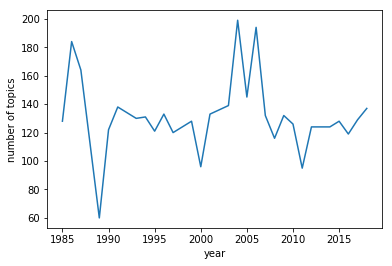

In [76]:
plt.plot(years, topics_by_year)
plt.xlabel("year")
plt.ylabel("number of topics");

In [18]:
from gensim.test.utils import common_corpus, common_dictionary

In [22]:
common_corpus

[[(0, 1), (1, 1), (2, 1)],
 [(0, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1)],
 [(2, 1), (5, 1), (7, 1), (8, 1)],
 [(1, 1), (5, 2), (8, 1)],
 [(3, 1), (6, 1), (7, 1)],
 [(9, 1)],
 [(9, 1), (10, 1)],
 [(9, 1), (10, 1), (11, 1)],
 [(4, 1), (10, 1), (11, 1)]]

In [20]:
hdp = models.HdpModel(common_corpus, common_dictionary)

In [21]:
hdp.print_topics(num_topics=20, num_words=10)

[(0,
  '0.192*response + 0.155*interface + 0.137*human + 0.134*survey + 0.081*minors + 0.081*graph + 0.066*trees + 0.061*system + 0.038*time + 0.029*user'),
 (1,
  '0.203*interface + 0.194*human + 0.148*computer + 0.136*survey + 0.095*response + 0.063*time + 0.049*eps + 0.043*graph + 0.039*trees + 0.015*minors'),
 (2,
  '0.239*eps + 0.171*user + 0.110*graph + 0.099*interface + 0.098*survey + 0.091*minors + 0.053*system + 0.041*computer + 0.039*trees + 0.033*human'),
 (3,
  '0.349*user + 0.242*eps + 0.187*human + 0.053*minors + 0.050*graph + 0.039*computer + 0.039*trees + 0.019*time + 0.011*interface + 0.008*system'),
 (4,
  '0.326*time + 0.230*human + 0.143*trees + 0.101*minors + 0.100*system + 0.041*graph + 0.030*survey + 0.008*interface + 0.007*response + 0.005*computer'),
 (5,
  '0.171*computer + 0.170*response + 0.165*interface + 0.147*trees + 0.107*time + 0.063*human + 0.047*system + 0.047*eps + 0.040*survey + 0.036*minors'),
 (6,
  '0.251*computer + 0.144*system + 0.107*graph + 0